<a href="https://colab.research.google.com/github/jazminfuentesb/Clon-de-Google/blob/main/M3_ProyectoE42.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Librerias usadas en el proyecto
import numpy as np
from scipy import stats
from scipy.stats import skew, kurtosis
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import seaborn as sns
import plotly.express as px
import folium

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Para correr el colab comenta los otros paths y descomenta el tuyo
# df = pd.read_csv('/content/drive/MyDrive/solar.csv', index_col=0) #Path Claudia
#df = pd.read_csv("/content/drive/MyDrive/Proyecto_Equipa42/Modulo3/solar.csv") #Path Bere
# data = pd.read_csv('/content/drive/MyDrive/Tecnolochicas/solar.csv') #Path_Ivana
df = pd.read_csv('/content/drive/MyDrive/BEDU/Proyecto2_Equipa42/solar.csv')
#Path Jazmín

In [ ]:
df.head(5)

,TimeUtc,TimeZone,LocalTime,Year,MonthOfYear,WeekOfYear,DayOfYear,HourOfDay,Latitude,Longitude,...,Pressure,Humidity,LinkeTurbidity,PrecipitableWater,WindSpeed,WindDirection,ExtraRadiation,GHI,DNI,DHI
0,2010-01-01 00:00:00,America/Mexico_City,2009-12-31 18:00:00-06:00,2009,12,53,365,18,18.0,-100.0,...,92229.0,56.840000,3.675,2.726047,1.98,197.0,1413.940576,0.0,0.0,0.0
1,2010-01-01 01:00:00,America/Mexico_City,2009-12-31 19:00:00-06:00,2009,12,53,365,19,18.0,-100.0,...,92304.0,59.779999,3.675,2.804144,2.05,195.0,1413.940576,0.0,-0.0,0.0
2,2010-01-01 02:00:00,America/Mexico_City,2009-12-31 20:00:00-06:00,2009,12,53,365,20,18.0,-100.0,...,92380.0,62.730000,3.675,2.876138,2.13,192.0,1413.940576,0.0,-0.0,0.0
3,2010-01-01 03:00:00,America/Mexico_City,2009-12-31 21:00:00-06:00,2009,12,53,365,21,18.0,-100.0,...,92423.0,65.669998,3.675,2.944591,2.21,164.0,1413.940576,0.0,-0.0,0.0
4,2010-01-01 04:00:00,America/Mexico_City,2009-12-31 22:00:00-06:00,2009,12,53,365,22,18.0,-100.0,...,92465.0,68.610001,3.675,3.008491,2.29,135.0,1413.940576,0.0,-0.0,0.0


#Sesión 1-Estimados de Locación y Variabilidad

Estimados de locación

In [ ]:
# La Irradiación Horizontal Global (GHI) es una métrica vital para la energía solar. Indica la potencia radiante recibida en una superficie perpendicular a los rayos solares.
# Analizaremos los siguientes estimados de locación de la GHI de nuestro DataBase
# Promedio
promedio = df['GHI'].mean()
print("Promedio de GHI:", promedio)
# Mediana
mediana = df['GHI'].median()
print("Mediana de GHI:", mediana)
# Media Truncada
media_truncada = stats.trim_mean(df['GHI'], 0.25)
print("Media Truncada de GHI:", media_truncada)
# Desviación Estándar
desviacion_estandar = df['GHI'].std()
print("Desviación Estándar de GHI:", desviacion_estandar)

Promedio de GHI: 240.63168224248255
Mediana de GHI: 0.0
Media Truncada de GHI: 103.53152307463692
Desviación Estándar de GHI: 327.6348317671108


In [ ]:
# Analizaremos la GHI a 2 Desviaciones Estándar
std = df['GHI'].std()
mean = df['GHI'].mean()
desviacion_estandar2 = df[(df['GHI'] >= mean - 2 * std) &
                          (df['GHI'] <= mean + 2 * std)].shape[0] / df.shape[0] * 100
print("GHI a 2 Desviaciones Estándar:", desviacion_estandar2)

GHI a 2 Desviaciones Estándar: 94.02211240320614


In [ ]:
# La Irradiación Normal Directa (DNI) es una medida de la radiación solar que llega a la Tierra en una trayectoria directa desde el sol. Es una parte importante de la Irradiación Horizontal Global (GHI).
# Analizaremos los siguientes estimados de locación de la DNI de nuestro DataBase
# Promedio
promedio = df['DNI'].mean()
print("Promedio de DNI:", promedio)
# Mediana
mediana = df['DNI'].median()
print("Mediana de DNI:", mediana)
# Media Truncada
media_truncada = stats.trim_mean(df['DNI'], 0.25)
print("Media Truncada de DNI:", media_truncada)
# Desviación Estándar
desviacion_estandar = df['DNI'].std()
print("Desviación Estándar de DNI:", desviacion_estandar)

Promedio de DNI: 254.50589017544326
Mediana de DNI: -0.0
Media Truncada de DNI: 94.67733593193135
Desviación Estándar de DNI: 356.9386048637413


In [ ]:
# Analizaremos la DNI a 2 Desviaciones Estándar
std = df['DNI'].std()
mean = df['DNI'].mean()
desviacion_estandar2 = df[(df['DNI'] >= mean - 2 * std) &
                          (df['DNI'] <= mean + 2 * std)].shape[0] / df.shape[0] * 100
print("DNI a 2 Desviaciones Estándar:", desviacion_estandar2)

DNI a 2 Desviaciones Estándar: 97.89441064700797


In [ ]:
# La Irradiación Horizontal Difusa (DHI) es un tipo de irradiación solar en la que las partículas y moléculas de la atmósfera terrestre dispersan la radiación solar.
# Analizaremos los siguientes estimados de locación de la DHI de nuestro DataBase
# Promedio
promedio = df['DHI'].mean()
print("Promedio de DHI:", promedio)
# Mediana
mediana = df['DHI'].median()
print("Mediana de DHI:", mediana)
# Media Truncada
media_truncada = stats.trim_mean(df['DHI'], 0.25)
print("Media Truncada de DHI:", media_truncada)
# Desviación Estándar
desviacion_estandar = df['DHI'].std()
print("Desviación Estándar de DHI:", desviacion_estandar)

Promedio de DHI: 74.34556398226209
Mediana de DHI: 0.0
Media Truncada de DHI: 33.724518156348374
Desviación Estándar de DHI: 112.93894466154296


In [ ]:
# Analizaremos la DHI a 2 Desviaciones Estándar
std = df['DHI'].std()
mean = df['DHI'].mean()
desviacion_estandar2 = df[(df['DHI'] >= mean - 2 * std) &
                          (df['DHI'] <= mean + 2 * std)].shape[0] / df.shape[0] * 100
print("DHI a 2 Desviaciones Estándar:", desviacion_estandar2)

DHI a 2 Desviaciones Estándar: 93.62179853103476


Estadísticos de Orden

In [ ]:
# Determinaremos el Rango de GHI, para obtenerlo necesitamos restar el valor maximo menos el valor minimo
# Rango
print("Rango para GHI:")
df['GHI'].max() - df['GHI'].min()


Rango para GHI:


1475.0

In [ ]:
# Determinaremos el Rango de DNI, para obtenerlo necesitamos restar el valor maximo menos el valor minimo
# Rango
df['DNI'].max() - df['DNI'].min()


1270.68994140625

In [ ]:
# Determinaremos el Rango de DHI, para obtenerlo necesitamos restar el valor maximo menos el valor minimo
# Rango
df['DHI'].max() - df['DHI'].min()

1014.0

In [ ]:
# Determinaremos los Percentiles 0, 10, 25, 50, 75, y 100 de GHI, tomando en cuenta que Pandas solo nos da cuantiles, emplearemos la siguiente logica: quantile = percentil / 100
print("Quantiles para GHI")
print(df['GHI'].quantile(0))
print(df['GHI'].quantile(0.1))
print(df['GHI'].quantile(0.25))
print(df['GHI'].quantile(0.5))
print(df['GHI'].quantile(0.75))
print(df['GHI'].quantile(1))

Quantiles para GHI
0.0
0.0
0.0
0.0
479.0
1475.0


In [ ]:
# Determinaremos los Percentiles 0, 10, 25, 50, 75, y 100 de DNI, tomando en cuenta que Pandas solo nos da cuantiles, emplearemos la siguiente logica: quantile = percentil / 100
print(df['DNI'].quantile(0))
print(df['DNI'].quantile(0.1))
print(df['DNI'].quantile(0.25))
print(df['DNI'].quantile(0.5))
print(df['DNI'].quantile(0.75))
print(df['DNI'].quantile(1))

0.0
-0.0
0.0
0.0
575.030029296875
1270.68994140625


In [ ]:
# Determinaremos los Percentiles 0, 10, 25, 50, 75, y 100 de DHI, tomando en cuenta que Pandas solo nos da cuantiles, emplearemos la siguiente logica: quantile = percentil / 100
print(df['DHI'].quantile(0))
print(df['DHI'].quantile(0.1))
print(df['DHI'].quantile(0.25))
print(df['DHI'].quantile(0.5))
print(df['DHI'].quantile(0.75))
print(df['DHI'].quantile(1))

0.0
0.0
0.0
0.0
112.0
1014.0


In [ ]:
# Determinaremos el Rango Intercuartílico de GHI, DNI y DHI
# Rango intercuartílico
ri_ghi = df['GHI'].quantile(0.75) - df['GHI'].quantile(0.25)
print("Rango intercuartílico de GHI:", ri_ghi)
ri_dni = df['DNI'].quantile(0.75) - df['DNI'].quantile(0.25)
print("Rango intercuartílico de DNI:", ri_dni)
ri_dhi = df['DHI'].quantile(0.75) - df['DHI'].quantile(0.25)
print("Rango intercuartílico de DHI:", ri_dhi)

Rango intercuartílico de GHI: 479.0
Rango intercuartílico de DNI: 575.030029296875
Rango intercuartílico de DHI: 112.0


#Sesión 2-Introducción a la visualización de datos: Distribuciones

Distribuciones

<Axes: xlabel='GHI'>

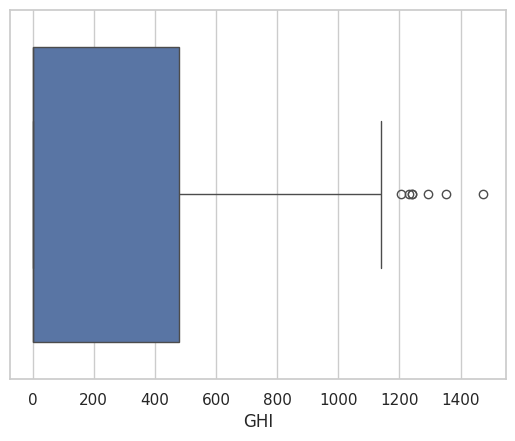

In [ ]:
# Boxplot o Diagrama de Caja de GHI
sns.set(style="whitegrid")
sns.boxplot(x=df["GHI"])

<Axes: xlabel='DNI'>

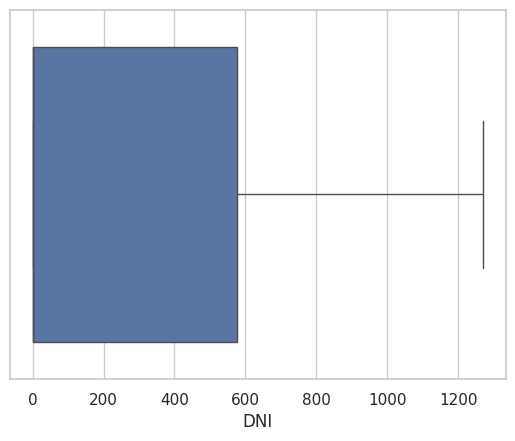

In [ ]:
# Boxplot o Diagrama de Caja de DNI
sns.set(style="whitegrid")
sns.boxplot(x=df["DNI"])

<Axes: xlabel='DHI'>

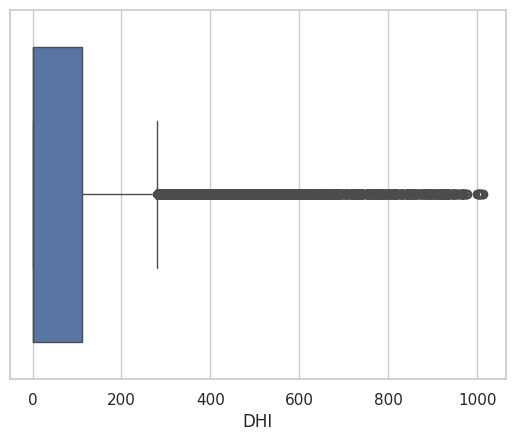

In [ ]:
# Boxplot o Diagrama de Caja de DHI
sns.set(style="whitegrid")
sns.boxplot(x=df["DHI"])

<Axes: xlabel='GHI'>

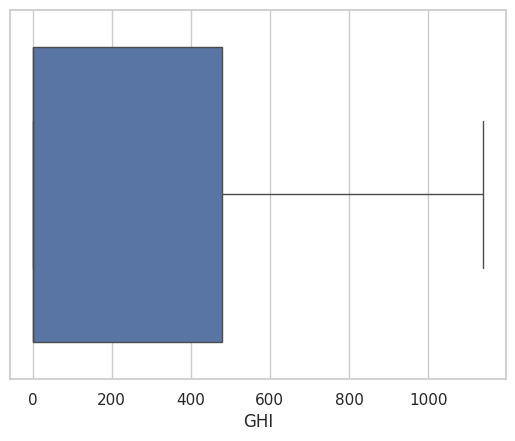

In [ ]:
# Ahora filtraremos la mayoria de los valores atipicos, para visualizar mejor los valores de GHI
iqr = df['GHI'].quantile(0.75) - df['GHI'].quantile(0.25)
filtro_superior = df['GHI'] > df['GHI'].quantile(0.25) - iqr * 1.5
filtro_inferior = df['GHI'] < df['GHI'].quantile(0.75) + iqr * 1.5

df_filtrado = df[filtro_inferior & filtro_superior]

sns.boxplot(x=df_filtrado['GHI'])


<Axes: xlabel='DNI'>

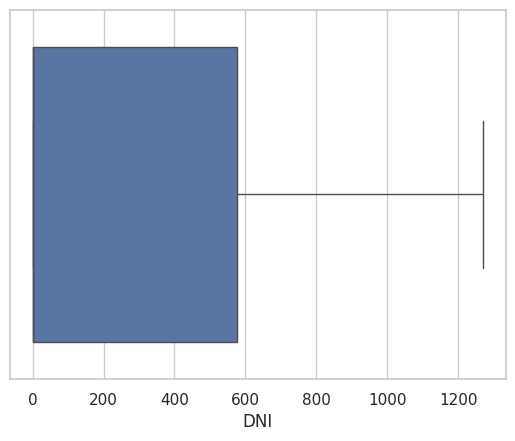

In [ ]:
# Ahora filtraremos la mayoria de los valores atipicos, para visualizar mejor los valores de DNI
iqr = df['DNI'].quantile(0.75) - df['DNI'].quantile(0.25)
filtro_superior = df['DNI'] > df['DNI'].quantile(0.25) - iqr * 1.5
filtro_inferior = df['DNI'] < df['DNI'].quantile(0.75) + iqr * 1.5

df_filtrado = df[filtro_inferior & filtro_superior]

sns.boxplot(x=df_filtrado['DNI'])

<Axes: xlabel='DHI'>

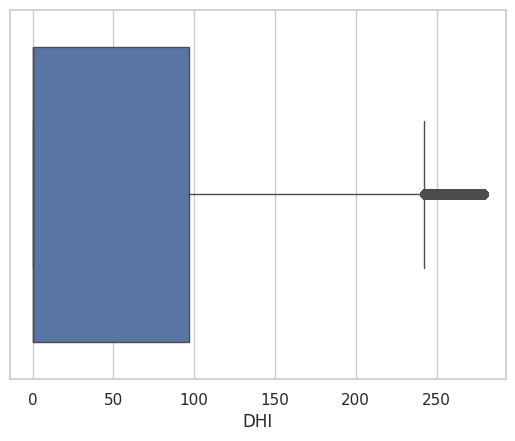

In [ ]:
# Ahora filtraremos la mayoria de los valores atipicos, para visualizar mejor los valores de DHI
iqr = df['DHI'].quantile(0.75) - df['DHI'].quantile(0.25)
filtro_superior = df['DHI'] > df['DHI'].quantile(0.25) - iqr * 1.5
filtro_inferior = df['DHI'] < df['DHI'].quantile(0.75) + iqr * 1.5

df_filtrado = df[filtro_inferior & filtro_superior]

sns.boxplot(x=df_filtrado['DHI'])

In [ ]:
# Tabla de Frecuencias de GHI, dividiremos en 100 rangos y le pediremos que nos muestre cuantos valores hay en cada uno de esos rangos
segmentos = pd.cut(df['GHI'], 100)
df['GHI'].groupby(segmentos).count()

<ipython-input-30-69682dd9ede4>:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df['GHI'].groupby(segmentos).count()


,GHI
GHI,
"(-1.475, 14.75]",289214
"(14.75, 29.5]",5561
"(29.5, 44.25]",5505
"(44.25, 59.0]",5204
"(59.0, 73.75]",5000
...,...
"(1401.25, 1416.0]",0
"(1416.0, 1430.75]",0
"(1430.75, 1445.5]",0


In [ ]:
# Tabla de Frecuencias de DNI, dividiremos en 100 rangos y le pediremos que nos muestre cuantos valores hay en cada uno de esos rangos
segmentos = pd.cut(df['DNI'], 100)
df['DNI'].groupby(segmentos).count()

<ipython-input-31-4b94e85ca915>:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df['DNI'].groupby(segmentos).count()


,DNI
DNI,
"(-1.271, 12.707]",314925
"(12.707, 25.414]",6302
"(25.414, 38.121]",3953
"(38.121, 50.828]",3275
"(50.828, 63.534]",2748
...,...
"(1207.155, 1219.862]",0
"(1219.862, 1232.569]",0
"(1232.569, 1245.276]",0


In [ ]:
# Tabla de Frecuencias de DHI, dividiremos en 100 rangos y le pediremos que nos muestre cuantos valores hay en cada uno de esos rangos
segmentos = pd.cut(df['DHI'], 100)
df['DHI'].groupby(segmentos).count()

<ipython-input-32-614639d84e12>:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df['DHI'].groupby(segmentos).count()


,DHI
DHI,
"(-1.014, 10.14]",287458
"(10.14, 20.28]",5102
"(20.28, 30.42]",5444
"(30.42, 40.56]",7229
"(40.56, 50.7]",9289
...,...
"(963.3, 973.44]",11
"(973.44, 983.58]",3
"(983.58, 993.72]",0


<Axes: xlabel='GHI', ylabel='Count'>

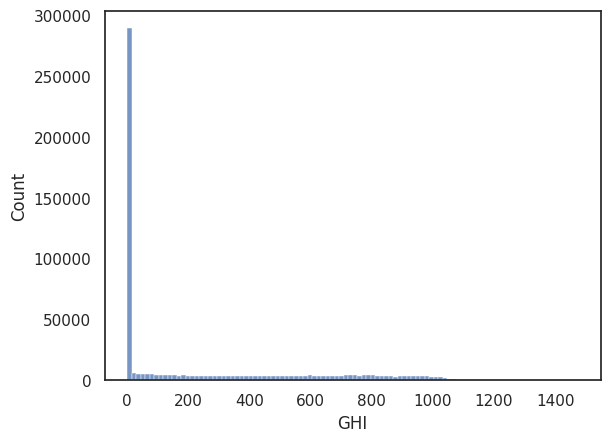

In [ ]:
# Histograma de GHI con los valores obtenidos con la tabla de frececuencia, con esto nos damos cuenta que tiene una Asimetría Positiva ya que los valores se concentran hacia la derecha
sns.set(style='white')
sns.histplot(data=df, x='GHI', bins=100)

<Axes: xlabel='DNI', ylabel='Count'>

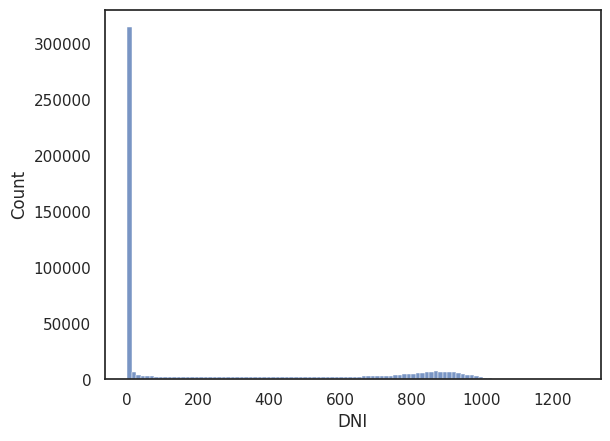

In [ ]:
# Histograma de DNI con los valores obtenidos con la tabla de frececuencia, con esto nos damos cuenta que tiene una Asimetría Positiva ya que los valores se concentran hacia la derecha
sns.set(style='white')
sns.histplot(data=df, x='DNI', bins=100)

<Axes: xlabel='DHI', ylabel='Count'>

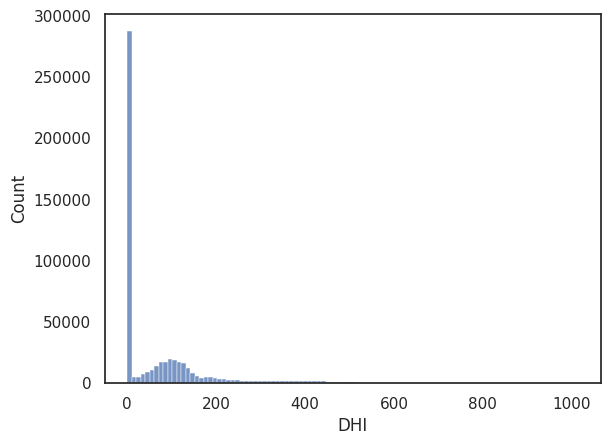

In [ ]:
# Histograma de DHI con los valores obtenidos con la tabla de frececuencia, con esto nos damos cuenta que tiene una Asimetría Positiva ya que los valores se concentran hacia la derecha
sns.set(style='white')
sns.histplot(data=df, x='DHI', bins=100)

In [ ]:
# Generamos un histograma mas interactivo de los valores de GHI
fig = px.histogram(df, x="GHI", nbins=100)
fig.show()

In [ ]:
# Generamos un histograma mas interactivo de los valores de DNI
fig = px.histogram(df, x="DNI", nbins=100)
fig.show()

In [ ]:
# Generamos un histograma mas interactivo de los valores de DHI
fig = px.histogram(df, x="DHI", nbins=100)
fig.show()

In [ ]:
# Calculamos la Simetría y la Curtosis de GHI, dandonos como resultado que tenemos una simetria positiva pero una curtosis negativa,
# que analizandolo bien, si su promedio fue de 240.63, comparandolo con el Diagrama de Caja y el Histograma
# se asemeja mas a una Distribución bimodal o modal, puesto que existen muchos datos dispersos de los cuales no se concentran en la media
skew_ghi = skew(df["GHI"])
kurtosis_ghi = kurtosis(df["GHI"])
print("Simetría de GHI:", skew_ghi)
print("Curtosis de GHI:", kurtosis_ghi)

Simetría de GHI: 1.048428480167978
Curtosis de GHI: -0.37108068364512325


In [ ]:
# Calculamos la Simetría y la Curtosis de DNI, dandonos como resultado que tenemos una simetria positiva pero una curtosis negativa,
# que analizandolo bien, si su promedio fue de 254.50, comparandolo con el Diagrama de Caja y el Histograma
# se asemeja mas a una Distribución bimodal o modal, puesto que existen muchos datos dispersos de los cuales no se concentran en la media
skew_dni = skew(df["DNI"])
kurtosis_dni = kurtosis(df["DNI"])
print("Simetría de DNI:", skew_dni)
print("Curtosis de DNI:", kurtosis_dni)

Simetría de DNI: 0.9497322574926477
Curtosis de DNI: -0.8116535368132323


In [ ]:
# Calculamos la Simetría y la Curtosis de DHI, dandonos como resultado que tenemos una simetria positiva y una curtosis positiva,
# que analizandolo bien, si su promedio fue de 74.34, comparandolo con el Diagrama de Caja y el Histograma
# se asemeja mas a una Distribución bimodal o modal, puesto que existen muchos datos dispersos de los cuales no se concentran en la media
skew_dhi = skew(df["DHI"])
kurtosis_dhi = kurtosis(df["DHI"])
print("Simetría de DHI:", skew_dhi)
print("Curtosis de DHI:", kurtosis_dhi)

Simetría de DHI: 2.076489934333238
Curtosis de DHI: 4.837125674439545


Gráfica de Densidad

In [ ]:
# Gráfica de Densidad de GHI, DNI y DHI
# Para hacer esta grafica primero ordenamos los valores que queremos graficar
by_time = df.groupby(level=0)[['GHI', 'DNI', 'DHI']].mean()
by_time

,GHI,DNI,DHI
0,0.0,0.000000,0.0
1,0.0,0.000000,0.0
2,0.0,0.000000,0.0
3,0.0,0.000000,0.0
4,0.0,0.000000,0.0
...,...,...,...
551812,582.0,269.390015,386.0
551813,570.0,240.020004,394.0
551814,644.0,535.159973,280.0
551815,562.0,664.510010,182.0


In [ ]:
# Vamos a agregar tambien la columna de Year
year = df.groupby(level=0)['Year'].last()
year

,Year
0,2009
1,2009
2,2009
3,2009
4,2009
...,...
551812,2006
551813,2006
551814,2006
551815,2006


In [ ]:
# Despues las unimos
merged = by_time.merge(year, left_index=True, right_index=True)
merged

,GHI,DNI,DHI,Year
0,0.0,0.000000,0.0,2009
1,0.0,0.000000,0.0,2009
2,0.0,0.000000,0.0,2009
3,0.0,0.000000,0.0,2009
4,0.0,0.000000,0.0,2009
...,...,...,...,...
551812,582.0,269.390015,386.0,2006
551813,570.0,240.020004,394.0,2006
551814,644.0,535.159973,280.0,2006
551815,562.0,664.510010,182.0,2006


In [ ]:
# Generamos la grafica para GHI segun los años 2006, 2007, 2008 y 2009
byghi_year6 = merged[merged['Year'] == "2009"]
byghi_year7 = merged[merged['Year'] == "2008"]
byghi_year8 = merged[merged['Year'] == "2007"]
byghi_year9 = merged[merged['Year'] == "2006"]
sns.kdeplot(data=byghi_year6['GHI'], fill=True, color="blue")
sns.kdeplot(data=byghi_year7['GHI'], fill=True, color="red")
sns.kdeplot(data=byghi_year8['GHI'], fill=True, color="yellow")
sns.kdeplot(data=byghi_year9['GHI'], fill=True, color="orange")

NameError: name 'merged' is not defined

<Axes: >

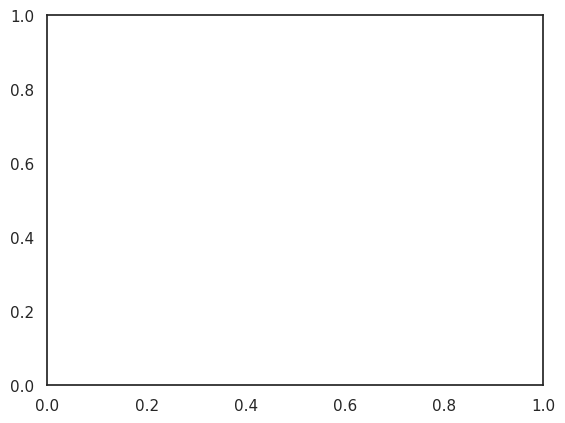

In [ ]:
# Generamos la grafica para DNI segun los años 2006, 2007, 2008 y 2009
bydni_year6 = merged[merged['Year'] == "2006"]
bydni_year7 = merged[merged['Year'] == "2007"]
bydni_year8 = merged[merged['Year'] == "2008"]
bydni_year9 = merged[merged['Year'] == "2009"]
sns.kdeplot(data=bydni_year6['DNI'], fill=True, color="blue")
sns.kdeplot(data=bydni_year7['DNI'], fill=True, color="red")
sns.kdeplot(data=bydni_year8['DNI'], fill=True, color="yellow")
sns.kdeplot(data=bydni_year9['DNI'], fill=True, color="orange")

<Axes: >

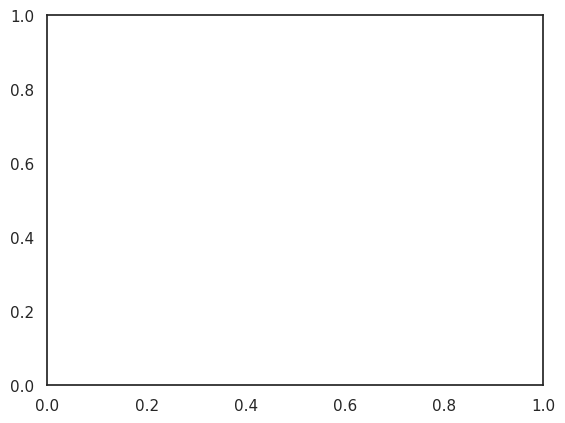

In [ ]:
# Generamos la grafica para DHI segun los años 2006, 2007, 2008 y 2009
bydhi_year6 = merged[merged['Year'] == "2006"]
bydhi_year7 = merged[merged['Year'] == "2007"]
bydhi_year8 = merged[merged['Year'] == "2008"]
bydhi_year9 = merged[merged['Year'] == "2009"]
sns.kdeplot(data=bydhi_year6['DHI'], fill=True, color="blue")
sns.kdeplot(data=bydhi_year7['DHI'], fill=True, color="red")
sns.kdeplot(data=bydhi_year8['DHI'], fill=True, color="yellow")
sns.kdeplot(data=bydhi_year9['DHI'], fill=True, color="orange")

# Sesión 3 - Exploración de variables categóricas y análisis multivariable

Frecuencia de cada valor de GHI:
 GHI
0.0       283710
11.0         485
12.0         456
10.0         452
14.0         450
           ...  
1125.0         1
1122.0         1
1134.0         1
1120.0         1
1115.0         1
Name: count, Length: 1138, dtype: int64
La moda de GHI es: 0.0


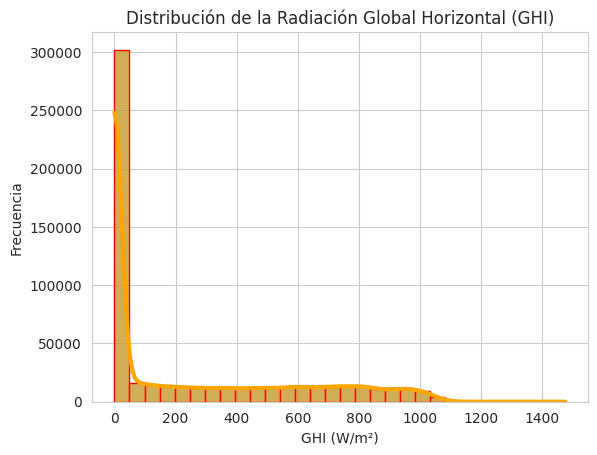

In [ ]:
# Contar la frecuencia de cada valor de GHI
data = df
conteo_ghi = data['GHI'].value_counts()
print("Frecuencia de cada valor de GHI:\n", conteo_ghi)

# Encontrar la moda de GHI
moda_ghi = conteo_ghi.idxmax()
print("La moda de GHI es:", moda_ghi)

# 2. histograma
sns.histplot(data=data, x='GHI', bins=30, kde=True)
#nota:el histograma de la radiación global horizontal(GHI), se realiza con 30 bins y una curva de densidad kernel (kde) para visualizar mejor la distribución.
# La kde se añande para suavizar la distribución y mostrar el panorama general de nuestros datos. PANORAMA GENERAL.

# 3. Personalizar gráfico
plt.title('Distribución de la Radiación Global Horizontal (GHI)')
plt.xlabel('GHI (W/m²)')
plt.ylabel('Frecuencia')
sns.histplot(data=data, x='GHI', bins=30, kde=True, color='orange',
line_kws={'linewidth': 3}, alpha=0.6, edgecolor='red')
plt.show()


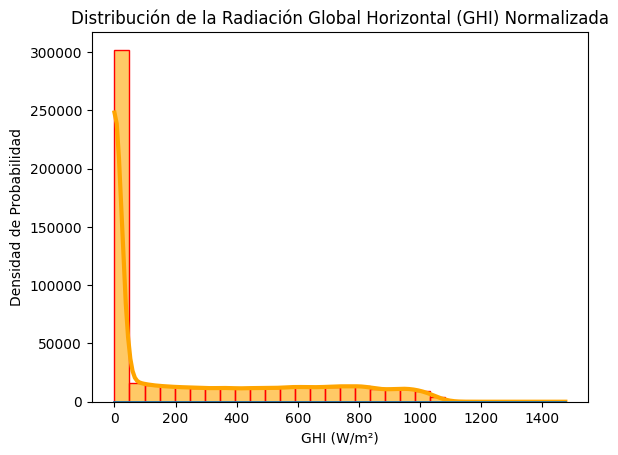

In [ ]:
# Se añade el mismo gráfico con datos normalizados para poder comparar con futuros datos aunque el tamaño muestral sea diferente.
plt.title('Distribución de la Radiación Global Horizontal (GHI)')
plt.xlabel('GHI (W/m²)')
plt.ylabel('Frecuencia')
sns.histplot(data=data, x='GHI', bins=30, kde=True, color='orange',
line_kws={'linewidth': 3}, alpha=0.6, edgecolor='red')
sns.set_palette(["orange", "lightcoral"])
sns.histplot(data=data, x='GHI', bins=30, kde=True, stat='density',
             line_kws={'linewidth': 2}, alpha=0.7, edgecolor='black')
plt.title('Distribución de la Radiación Global Horizontal (GHI) Normalizada')
plt.xlabel('GHI (W/m²)')
plt.ylabel('Densidad de Probabilidad')
plt.show()

Frecuencia de cada valor de DHI:
 DNI
0.000000      309324
874.760010        16
881.690002        15
19.090000         15
884.419983        15
               ...  
209.910004         1
369.609985         1
746.130005         1
368.630005         1
539.000000         1
Name: count, Length: 88625, dtype: int64
La moda de DNI es: 0.0


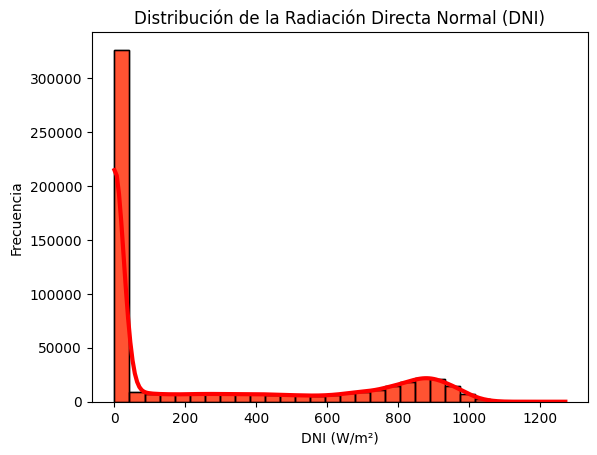

In [ ]:
# Contar la frecuencia de cada valor de DNI
conteo_dni = data['DNI'].value_counts()
print("Frecuencia de cada valor de DHI:\n", conteo_dni)

# Encontrar la moda de DNI
moda_dni = conteo_dni.idxmax()
print("La moda de DNI es:", moda_dni)
#Repetimos el proceso anterior pero en este caso para la distribución de la radiación directa normal (DNI)
# histograma
sns.histplot(data=data, x='DNI', bins=30, kde=True)

# Personalizar gráfico
plt.title('Distribución de la Radiación Directa Normal (DNI)')
plt.xlabel('DNI (W/m²)')
plt.ylabel('Frecuencia')
sns.histplot(data=data, x='DNI', bins=30, kde=True, color='red',
line_kws={'linewidth': 3}, alpha=0.6, edgecolor='black')
plt.show()

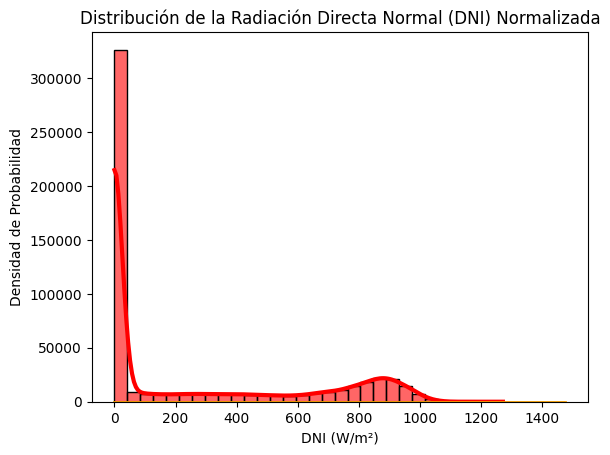

In [ ]:
# Gráfico normalizado
plt.title('Distribución de la Radiación Directa Normal (DNI)')
plt.xlabel('DNI (W/m²)')
plt.ylabel('Frecuencia')
sns.histplot(data=data, x='DNI', bins=30, kde=True, color='red',
line_kws={'linewidth': 3}, alpha=0.6, edgecolor='black')
sns.set_palette("magma")
sns.histplot(data=data, x='GHI', bins=30, kde=True, stat='density',
             line_kws={'linewidth': 2}, alpha=0.7, edgecolor='black')
plt.title('Distribución de la Radiación Directa Normal (DNI) Normalizada')
plt.xlabel('DNI (W/m²)')
plt.ylabel('Densidad de Probabilidad')
plt.show()


Frecuencia de cada valor de DHI:
 DHI
0.0      283723
102.0      2071
96.0       2043
97.0       2003
94.0       1998
          ...  
687.0         1
943.0         1
788.0         1
752.0         1
660.0         1
Name: count, Length: 890, dtype: int64
La moda de DHI es: 0.0


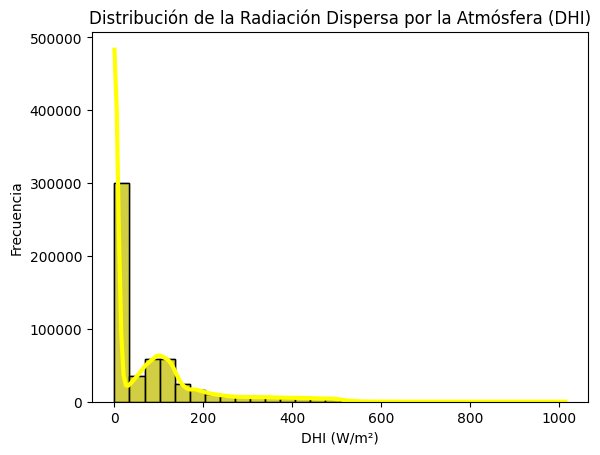

In [ ]:
# Contar la frecuencia de cada valor de DHI
conteo_dhi = data['DHI'].value_counts()
print("Frecuencia de cada valor de DHI:\n", conteo_dhi)

# Encontrar la moda de DHI
moda_dhi = conteo_dhi.idxmax()
print("La moda de DHI es:", moda_dhi)
#Repetimos el proceso anterior pero en este caso para la distribución de la radiación dispersa por la atmósfera (DHI)
# histograma
sns.histplot(data=data, x='DHI', bins=30, kde=True)

# Personalizar gráfico
plt.title('Distribución de la Radiación Dispersa por la Atmósfera (DHI)')
plt.xlabel('DHI (W/m²)')
plt.ylabel('Frecuencia')
sns.histplot(data=data, x='DHI', bins=30, kde=True, color='yellow',
line_kws={'linewidth': 3}, alpha=0.6, edgecolor='black')
plt.show()

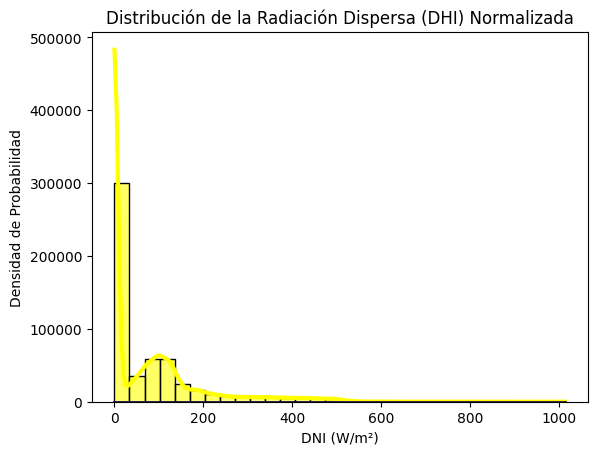

In [ ]:
# Gráfico normalizado
plt.title('Distribución de la Radiación Dispersa por la Atmósfera (DNI) Normalizada')
plt.xlabel('DHI (W/m²)')
plt.ylabel('Frecuencia')
sns.histplot(data=data, x='DHI', bins=30, kde=True, color='yellow',
line_kws={'linewidth': 3}, alpha=0.6, edgecolor='black')
sns.set_palette("viridis")
sns.histplot(data=data, x='DHI', bins=30, kde=True, stat='density',
             line_kws={'linewidth': 2}, alpha=0.7, edgecolor='black')
plt.title('Distribución de la Radiación Dispersa (DHI) Normalizada')
plt.xlabel('DNI (W/m²)')
plt.ylabel('Densidad de Probabilidad')
plt.show()


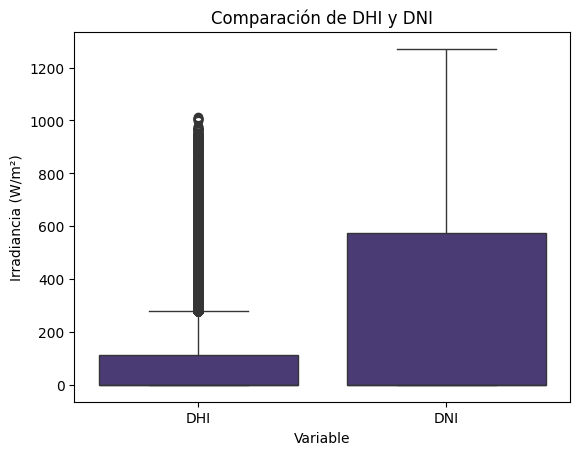

In [ ]:
# Boxplot con la finalidad de comparar de manera concreta DHI y DNI
data_melted = pd.melt(data, id_vars=None, value_vars=['DHI', 'DNI'],
 var_name='variable', value_name='value')
sns.boxplot(data=data_melted, x='variable', y='value')

plt.title('Comparación de DHI y DNI')
plt.xlabel('Variable')
plt.ylabel('Irradiancia (W/m²)')
plt.show()

In [ ]:
#La línea central de la caja indica que la mediana de los valores de DHI es relativamente baja, sugiriendo que la radiación directa es mayor


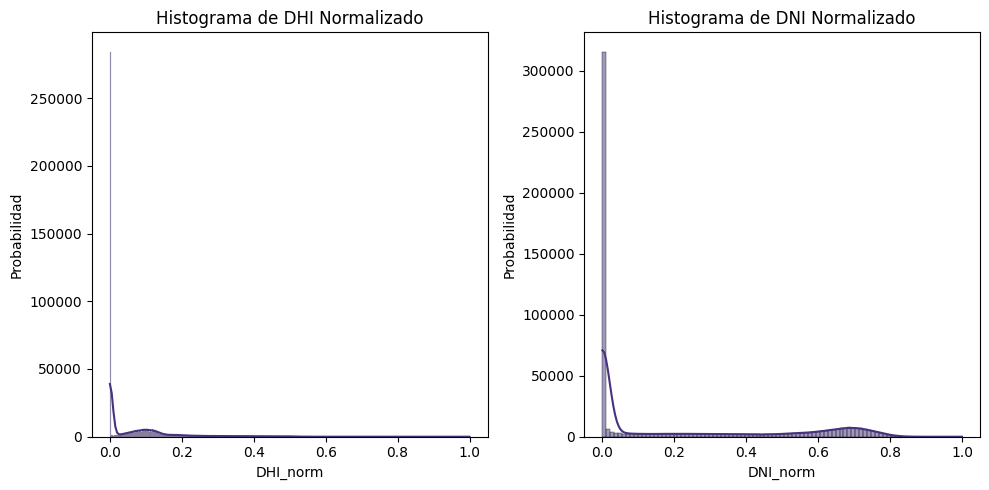

In [ ]:
# Subplot con la finalidad de realizar una comparación visual de las distribuciones de manera simplificada.
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# Crear un subplot comparativo de datos normalizados
# Normalizar los datos
data['DHI_norm'] = (data['DHI'] - data['DHI'].min()) / (data['DHI'].max() - data['DHI'].min())
data['DNI_norm'] = (data['DNI'] - data['DNI'].min()) / (data['DNI'].max() - data['DNI'].min())

# Crear una figura con 1 fila y 2 columnas
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

# Histograma para DHI normalizado
sns.histplot(data=data, x='DHI_norm', ax=axes[0], kde=True)
axes[0].set_title('Histograma de DHI Normalizado')
axes[0].set_ylabel('Probabilidad')

# Histograma para DNI normalizado
sns.histplot(data=data, x='DNI_norm', ax=axes[1], kde=True)
axes[1].set_title('Histograma de DNI Normalizado')
axes[1].set_ylabel('Probabilidad')

# Ajustar el espaciado entre subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()

In [ ]:
# Filtrar los datos para excluir los valores cero de GHI
data_sin_ceros = data[data['GHI'] != 0]

# Contar la frecuencia de cada valor de GHI (sin ceros)
conteo_ghi_sin_ceros = data_sin_ceros['GHI'].value_counts()
print("Frecuencia de cada valor de GHI (sin ceros):\n", conteo_ghi_sin_ceros)

# Encontrar la moda de DHI (sin ceros)
moda_ghi_sin_ceros = conteo_ghi_sin_ceros.idxmax()
print("La moda de GHI (sin ceros) es:", moda_ghi_sin_ceros)

Frecuencia de cada valor de GHI (sin ceros):
 GHI
11.0      485
12.0      456
10.0      452
14.0      450
13.0      438
         ... 
1125.0      1
1122.0      1
1134.0      1
1120.0      1
1115.0      1
Name: count, Length: 1137, dtype: int64
La moda de GHI (sin ceros) es: 11.0


Frecuencia de cada valor de DNI (sin ceros):
 DNI
874.760010    16
884.419983    15
933.580017    15
19.090000     15
881.690002    15
              ..
40.459999      1
198.550003     1
231.339996     1
685.159973     1
539.000000     1
Name: count, Length: 88624, dtype: int64
La moda de DNI (sin ceros) es: 874.760009765625


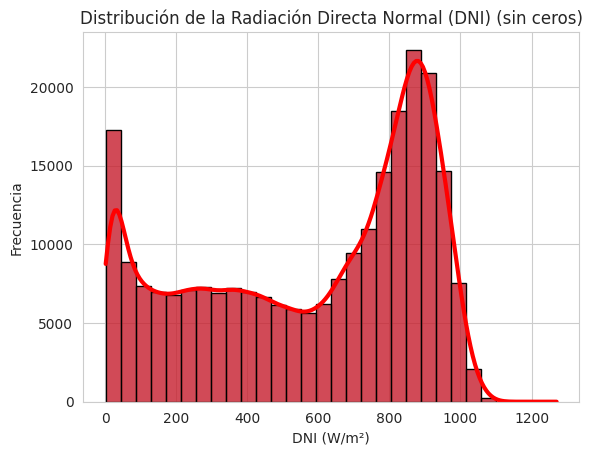

In [ ]:
# Filtrar los datos para excluir los valores cero de DNI
data_sin_ceros = data[data['DNI'] != 0]

# Contar la frecuencia de cada valor de DNI (sin ceros)
conteo_dni_sin_ceros = data_sin_ceros['DNI'].value_counts()
print("Frecuencia de cada valor de DNI (sin ceros):\n", conteo_dni_sin_ceros)
# Encontrar la moda de DNI (sin ceros)
moda_dni_sin_ceros = conteo_dni_sin_ceros.idxmax()
print("La moda de DNI (sin ceros) es:", moda_dni_sin_ceros)

# Histograma de DNI (sin ceros)
sns.histplot(data=data_sin_ceros, x='DNI', bins=30, kde=True)

# Personalizar gráfico
plt.title('Distribución de la Radiación Directa Normal (DNI) (sin ceros)')
plt.xlabel('DNI (W/m²)')
plt.ylabel('Frecuencia')
sns.histplot(data=data_sin_ceros, x='DNI', bins=30, kde=True, color='red',
             line_kws={'linewidth': 3}, alpha=0.6, edgecolor='black')
plt.show()

Frecuencia de cada valor de DHI (sin ceros):
 DHI
102.0    2071
96.0     2043
97.0     2003
94.0     1998
100.0    1984
         ... 
687.0       1
943.0       1
788.0       1
752.0       1
660.0       1
Name: count, Length: 889, dtype: int64
La moda de DHI (sin ceros) es: 102.0


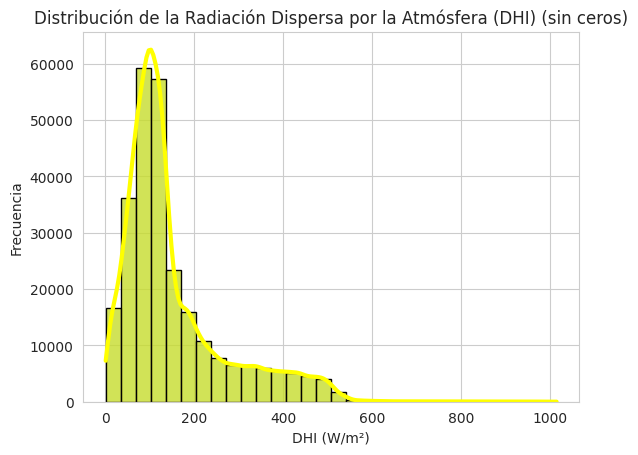

In [ ]:
# Filtrar los datos para excluir los valores cero de DHI
data_sin_ceros = data[data['DHI'] != 0]

# Contar la frecuencia de cada valor de DHI (sin ceros)
conteo_dhi_sin_ceros = data_sin_ceros['DHI'].value_counts()
print("Frecuencia de cada valor de DHI (sin ceros):\n", conteo_dhi_sin_ceros)

# Encontrar la moda de DHI (sin ceros)
moda_dhi_sin_ceros = conteo_dhi_sin_ceros.idxmax()
print("La moda de DHI (sin ceros) es:", moda_dhi_sin_ceros)

# Histograma de DHI (sin ceros)
sns.histplot(data=data_sin_ceros, x='DHI', bins=30, kde=True)

# Personalizar gráfico
plt.title('Distribución de la Radiación Dispersa por la Atmósfera (DHI) (sin ceros)')
plt.xlabel('DHI (W/m²)')
plt.ylabel('Frecuencia')
sns.histplot(data=data_sin_ceros, x='DHI', bins=30, kde=True, color='yellow',
             line_kws={'linewidth': 3}, alpha=0.6, edgecolor='black')
plt.show()

NameError: name 'data' is not defined

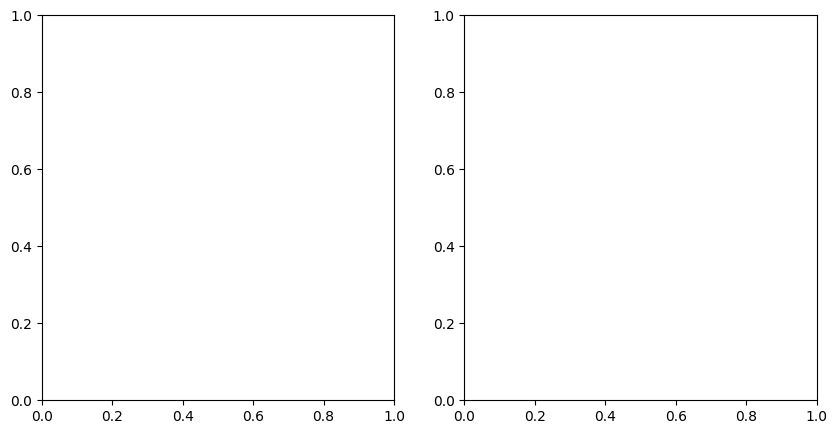

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Crear un subplot comparativo de datos sin normalizar y sin ceros
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

# Filtrar los datos para excluir los valores cero en DHI y DNI
data_sin_ceros = data[(data['DHI'] != 0) & (data['DNI'] != 0)]

# Histograma para DHI (sin ceros)
sns.histplot(data=data_sin_ceros, x='DHI', ax=axes[0], kde=True)
axes[0].set_title('Histograma de DHI (sin ceros)')
axes[0].set_ylabel('Frecuencia')

# Histograma para DNI (sin ceros)
sns.histplot(data=data_sin_ceros, x='DNI', ax=axes[1], kde=True)
axes[1].set_title('Histograma de DNI (sin ceros)')
axes[1].set_ylabel('Frecuencia')

# Ajustar el espaciado entre subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()

#Sesión 4 - Correlaciones y regresión lineal simple

In [ ]:
#Creamos un DataSet exclusivamente con valores numericos para ello verificamos los tipos de dato de cala columna
data_types = df.dtypes
data_types

,0
TimeUtc,object
TimeZone,object
LocalTime,object
Year,int64
MonthOfYear,int64
WeekOfYear,int64
DayOfYear,int64
HourOfDay,int64
Latitude,float64
Longitude,float64


In [ ]:
#Ahora seleccionamod sólo las columnas cuyos tipo de dato sean float e int con el metodo select_dtypes
df_num = df.select_dtypes(include=['float64', 'int64'])
df_num.head()

,Year,MonthOfYear,WeekOfYear,DayOfYear,HourOfDay,Latitude,Longitude,Altitude,ApparentZenith,Zenith,...,Pressure,Humidity,LinkeTurbidity,PrecipitableWater,WindSpeed,WindDirection,ExtraRadiation,GHI,DNI,DHI
0,2009,12,53,365,18,18.0,-100.0,787.0,87.288419,87.508232,...,92229.0,56.840000,3.675,2.726047,1.98,197.0,1413.940576,0.0,0.0,0.0
1,2009,12,53,365,19,18.0,-100.0,787.0,100.634358,100.634358,...,92304.0,59.779999,3.675,2.804144,2.05,195.0,1413.940576,0.0,-0.0,0.0
2,2009,12,53,365,20,18.0,-100.0,787.0,114.093706,114.093706,...,92380.0,62.730000,3.675,2.876138,2.13,192.0,1413.940576,0.0,-0.0,0.0
3,2009,12,53,365,21,18.0,-100.0,787.0,127.760150,127.760150,...,92423.0,65.669998,3.675,2.944591,2.21,164.0,1413.940576,0.0,-0.0,0.0
4,2009,12,53,365,22,18.0,-100.0,787.0,141.537857,141.537857,...,92465.0,68.610001,3.675,3.008491,2.29,135.0,1413.940576,0.0,-0.0,0.0


In [ ]:
#Con el nuevo DataSet obtenemos la matriz de correlaciones
df_num.corr()

,Year,MonthOfYear,WeekOfYear,DayOfYear,HourOfDay,Latitude,Longitude,Altitude,ApparentZenith,Zenith,...,Pressure,Humidity,LinkeTurbidity,PrecipitableWater,WindSpeed,WindDirection,ExtraRadiation,GHI,DNI,DHI
Year,1.000000,2.217734e-02,0.021793,0.022299,-2.905055e-04,8.557956e-02,-1.141821e-01,9.824865e-02,-0.015259,-0.015260,...,-0.099796,0.005260,0.016557,-0.034566,-0.090926,0.016521,-0.086344,0.005233,0.002491,0.005614
MonthOfYear,0.022177,1.000000e+00,0.969585,0.996504,-4.333057e-04,5.759266e-15,2.434415e-15,-2.638611e-15,0.028598,0.028619,...,-0.001022,0.169582,-0.015526,0.172932,-0.086821,-0.062498,-0.038679,-0.042955,-0.038658,-0.009547
WeekOfYear,0.021793,9.695854e-01,1.000000,0.970970,-3.825244e-04,2.088164e-03,-1.596451e-03,-1.786807e-03,0.030315,0.030337,...,0.000666,0.169023,-0.020634,0.170278,-0.085057,-0.063042,-0.029429,-0.043905,-0.038317,-0.011075
DayOfYear,0.022299,9.965036e-01,0.970970,1.000000,-4.820206e-04,-1.526144e-04,2.805727e-04,-3.168323e-05,0.029246,0.029268,...,-0.001014,0.169372,-0.017433,0.171422,-0.086444,-0.061223,-0.035477,-0.043092,-0.038476,-0.009754
HourOfDay,-0.000291,-4.333057e-04,-0.000383,-0.000482,1.000000e+00,1.780391e-15,-6.326147e-15,2.728921e-15,-0.349654,-0.349563,...,-0.005487,-0.236737,0.000175,-0.016605,0.141516,0.066342,-0.000233,0.193254,0.180504,0.176362
Latitude,0.085580,5.759266e-15,0.002088,-0.000153,1.780391e-15,1.000000e+00,-7.462148e-01,-1.330200e-01,-0.000765,-0.000733,...,0.131196,-0.387436,-0.264023,-0.390948,0.131146,0.233417,0.000112,0.009272,0.092331,-0.105218
Longitude,-0.114182,2.434415e-15,-0.001596,0.000281,-6.326147e-15,-7.462148e-01,1.000000e+00,1.656041e-02,0.000579,0.000558,...,-0.013085,0.245267,0.288133,0.310623,0.111307,-0.295910,0.000044,-0.022332,-0.095231,0.091696
Altitude,0.098249,-2.638611e-15,-0.001787,-0.000032,2.728921e-15,-1.330200e-01,1.656041e-02,1.000000e+00,0.000128,0.000081,...,-0.998718,-0.234317,-0.341764,-0.588640,-0.154613,-0.070949,-0.000251,0.016276,0.010552,0.018432
ApparentZenith,-0.015259,2.859758e-02,0.030315,0.029246,-3.496542e-01,-7.646918e-04,5.789721e-04,1.276002e-04,1.000000,0.999999,...,0.007813,0.399916,-0.122481,-0.032727,-0.184808,-0.056759,0.198323,-0.840619,-0.711941,-0.735882
Zenith,-0.015260,2.861895e-02,0.030337,0.029268,-3.495631e-01,-7.329726e-04,5.582622e-04,8.138153e-05,0.999999,1.000000,...,0.007861,0.399952,-0.122504,-0.032711,-0.184821,-0.056749,0.198378,-0.840875,-0.712073,-0.736078


<Axes: >

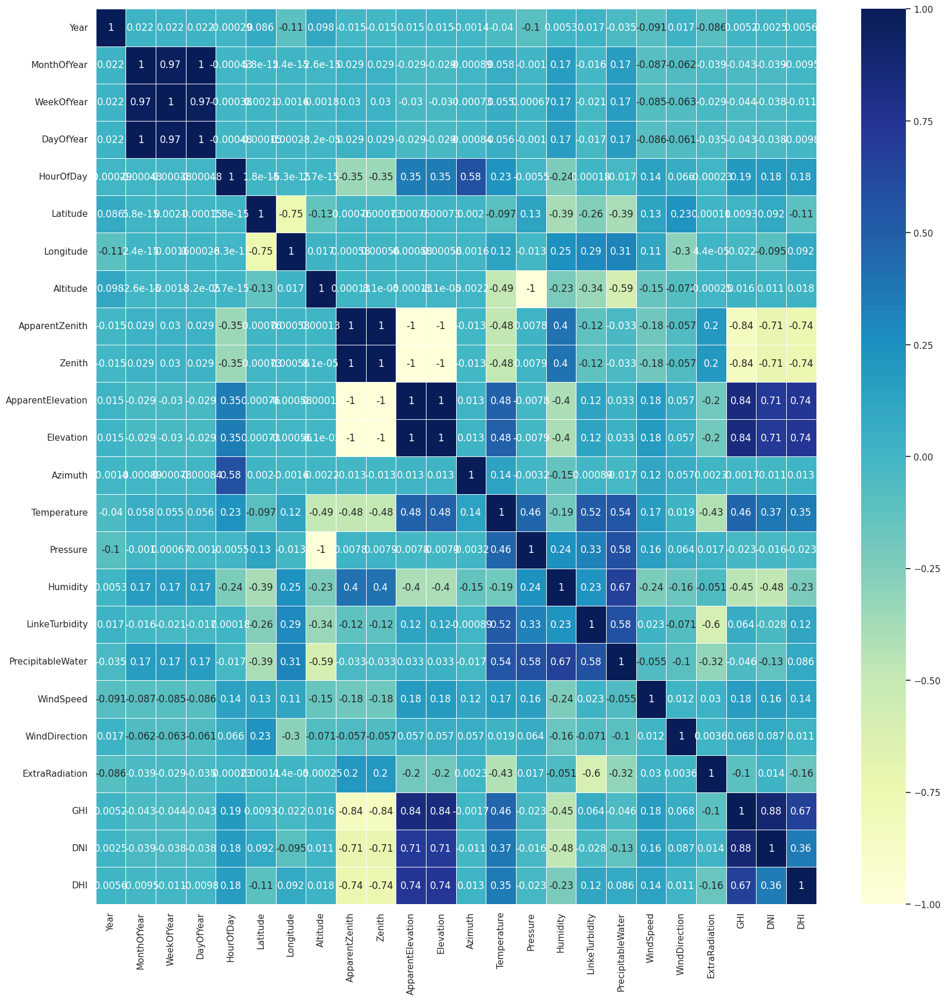

In [ ]:
#Para visualizar mejor las correlaciones usamos un mapa de calor
plt.figure(figsize=(20, 20))
sns.heatmap(df_num.corr(), annot=True, cmap="YlGnBu", linewidths=0.5, linecolor="white")
#El mapa de calor nos da varias variables candidatas que poseen una correlación fuerte, pero vamo s a analizar la correlación entre las variables de radiación GHI, DHI y DNI

In [ ]:
#El mapa de calor nos ayuda a visualizar las variables que tienen mayor correlación, sin embargo, no nos permite ver si se puede ajustar a algun modelo como una regresión lineal, logaritmica, etc. De acuerdo a la teoría sabemos que la radiación está fuertemente relacionada a la hora del día, sin embargo, si sacamos la correlación de estas dos variables observamos que esta es muy baja
print("Correlacion entre hora del d[ia y GHI")
df_num['HourOfDay'].corr(df_num['GHI'])

Correlacion entre hora del d[ia y GHI


0.19325386456359286

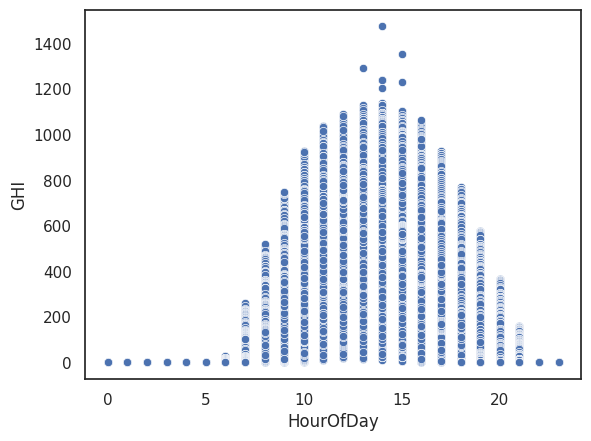

In [ ]:
#Al observar su diagrama de disperción vemos que los datos tienen algunos ceros y no siguen precisamente una linea o una parabola
sns.scatterplot(data=df_num, y="GHI", x="HourOfDay");

Correlacion limpia entre hora del dia y GHI


0.10596195890896487

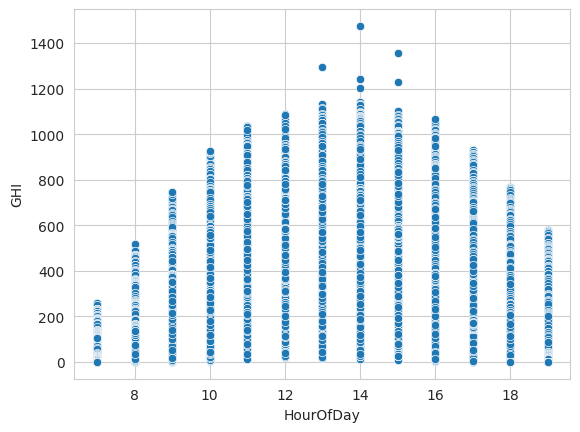

In [ ]:
#Vamos a limpiar un poco el diagrama para ver si la correlación aumenta ya que no hay radiación antes de las 6h ni después de las 20h
df_clean = df_num[df_num['HourOfDay'] > 6]
df_clean = df_clean[df_clean['HourOfDay'] < 20]
sns.scatterplot(data=df_clean, y="GHI", x="HourOfDay");
print("Correlacion limpia entre hora del dia y GHI")
df_clean['HourOfDay'].corr(df_clean['GHI'])
#Descartamos esta tupla ya que incluso descartando los datos que son 0s la correlación disminuye, ademas no se ajustan a un modelo de regresión lineal

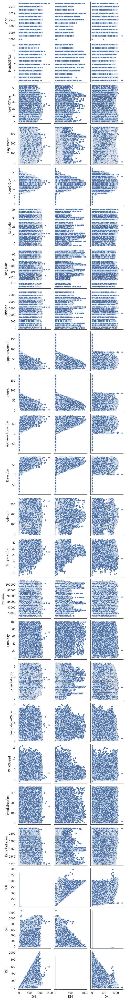

In [ ]:
# La teoría también nos dice que la radiación se ve afectada por las condiciones ambientales y la posición del sol. Vamos a crear diagramas de disperción de las variables de radiación y el resto de las columnas para visualizar si hay una dupla candidata que se pueda ajustar a un modelo de regresión lineal. No generamos todos ya que es una gran cantidad de diagramas que implica una gran demanda de computo.
sns.pairplot(df_num, x_vars=['GHI', 'DHI', 'DNI'], y_vars=df_num.columns);

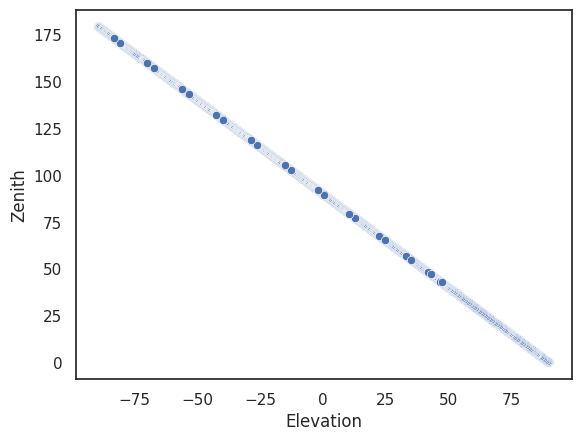

In [ ]:
#Los diagramas de dispersión no nos dieron ningun candidato viable. Pero también sabemos que las variables que nos ayudan a conocer la posición del sol como son el azimuth y la elevación están inversamente relacionadas. Así que decidimos generar ese diagrama de dispersión
sns.scatterplot(data=df_num, x="Elevation", y="Zenith");

In [ ]:
#Del mapa de calor podemos ver que ambas variables tienen una correlación de -1, pues mientras una aumenta la otra disminuye
df_num['Elevation'].corr(df_num['Zenith'])

-1.0

In [ ]:
#Esta tumpla cumple los dos requisitos necesarios para generar nuetro modelo de regresión lineal simple. El primero que su diagrama de dispersión siga un comportamiento lineal y el segundo que tenga una alta correlación. Así que vamos a entrenar el modelo con esa tupla
lr = LinearRegression()
# Fit = Entrenamiento
# Vamos a entrenar nuestro modelo. La primera variable que le pasamos es la independiente y la segunda la dependiente

lr.fit(df_num['Elevation'].to_frame(), df_num['Zenith'])


LinearRegression()

In [ ]:
#Vamos a probar nuestro modelo con valores aleatorios de elevación generados con chatGPT
serie_predict = pd.Series([30, 34, 39, 45, 50, 54, 53, 50, 46, 40, 35, 31])
y_predict = lr.predict(serie_predict.to_frame())
y_predict

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



array([60., 56., 51., 45., 40., 36., 37., 40., 44., 50., 55., 59.])

In [ ]:
lr.score(df_num['Elevation'].to_frame(), df_num['Zenith'])
#Como podemos ver nuestro modelo en primera instancia parece ser muy bueno para predecir los valores, sin embargo, hay que tener cuidado ya que el sol puede estar tanto en el eje positivo de x como en el negativo, cambiando así la medición del ángulo

1.0

#Sesión 5 - Distribuciones muestrales y técnicas de evaluación de modelos

##Poblaciones y muestras  

###Samples

####Sample 1 - Humidity


In [ ]:
# Replace == True, quiere decir con reposición, o sea, tomo un elemento, lo coloco en mi muestra y lo vuelvo a poner en el dataset original
# Esto quiere decir que podría pasar que lo vuelva a tomar

df['Humidity'].sample(n=20, replace=True)


,Humidity
497329,26.980000
314317,77.430000
244749,94.559998
531586,76.900002
448187,27.280001
448817,7.900000
81490,21.990000
387686,100.000000
269327,85.750000
532984,89.209999


##### Bootstrap

In [ ]:
#Uso de Bootstrap
df['Humidity'].mean()

66.9472845515836

In [ ]:
humidity = df['Humidity']

means = []

# n=50 significa que todas las muestras que estoy tomando van a tener 50 elementos
for i in range(100_000):
  sample = humidity.sample(n=50, replace=True)
  means.append(sample.mean())

serie_means = pd.Series(means)

##### Gráficas

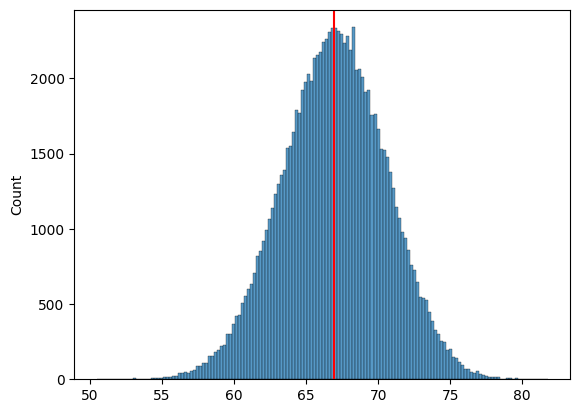

In [ ]:
sns.histplot(serie_means)
plt.axvline(df['Humidity'].mean(), color='red')

In [ ]:
#Uso de gráficas con análisis estadístico (Intervalos de confianza)

limite_inferior = serie_means.quantile(0.025)
limite_superior = serie_means.quantile(0.975)

print(f'El intervalo de confianza es de {limite_inferior} a {limite_superior}')

El intervalo de confianza es de 59.827370253562925 a 73.84221989536285


In [ ]:
humidity.mean()

66.9472845515836

In [ ]:
promedio_de_los_intervalos = ((humidity.mean() - limite_inferior) + (limite_superior - humidity.mean())) / 2

print(f'Intervalo de 95% de confianza de la media: {humidity.mean()} +/- {promedio_de_los_intervalos}')

Intervalo de 95% de confianza de la media: 66.9472845515836 +/- 7.00742482089996


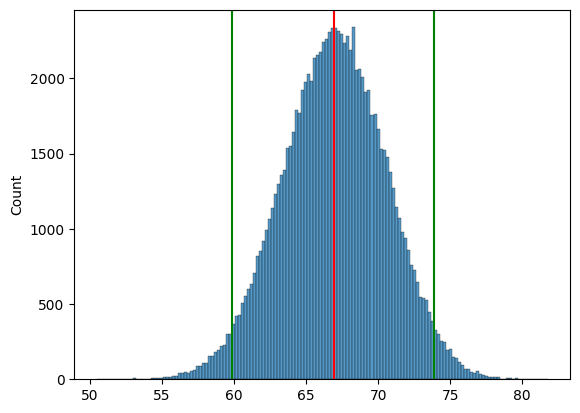

In [ ]:
sns.histplot(serie_means)
plt.axvline(df['Humidity'].mean(), color='red')
plt.axvline(limite_inferior, color='green')
plt.axvline(limite_superior, color='green')

#### Sample 2 - Pressure


In [ ]:
df['Pressure'].sample(n=20, replace=True)

,Pressure
551675,77010.0
461936,92096.0
453210,74954.0
158119,97967.0
233214,100127.0
367049,100398.0
479113,88075.0
507983,84934.0
75486,94087.0
387069,83835.0


##### Bootstrap

In [ ]:
#Uso de Bootstrap
df['Pressure'].mean()

91813.41604916123

In [ ]:
pressure = df['Pressure']

means = []

# n=50 significa que todas las muestras que estoy tomando van a tener 50 elementos
for i in range(100_000):
  sample = pressure.sample(n=50, replace=True)
  means.append(sample.mean())

serie_means = pd.Series(means)

In [ ]:
pressure.mean()

In [ ]:
promedio_de_los_intervalos = ((pressure.mean() - limite_inferior) + (limite_superior - pressure.mean())) / 2

print(f'Intervalo de 95% de confianza de la media: {pressure.mean()} +/- {promedio_de_los_intervalos}')

In [ ]:
sns.histplot(serie_means)
plt.axvline(df['Pressure'].mean(), color='red')
plt.axvline(limite_inferior, color='green')
plt.axvline(limite_superior, color='green')

#### Sample 3 - ExtraRadiation

In [ ]:
df['ExtraRadiation'].sample(n=20, replace=True)

##### Bootstrap

In [ ]:
#Uso de Bootstrap
df['ExtraRadiation'].mean()

In [ ]:
extraradiation = df['ExtraRadiation']

means = []

# n=50 significa que todas las muestras que estoy tomando van a tener 50 elementos
for i in range(100_000):
  sample = extraradiation.sample(n=50, replace=True)
  means.append(sample.mean())

serie_means = pd.Series(means)

##### Gráficas

In [ ]:
sns.histplot(serie_means)
plt.axvline(df['ExtraRadiation'].mean(), color='red')

In [ ]:
#Uso de gráficas con análisis estadístico (Intervalos de confianza)

limite_inferior = serie_means.quantile(0.025)
limite_superior = serie_means.quantile(0.975)

print(f'El intervalo de confianza es de {limite_inferior} a {limite_superior}')

In [ ]:
extraradiation.mean()

In [ ]:
promedio_de_los_intervalos = ((extraradiation.mean() - limite_inferior) + (limite_superior - extraradiation.mean())) / 2

print(f'Intervalo de 95% de confianza de la media: {extraradiation.mean()} +/- {promedio_de_los_intervalos}')

In [ ]:
sns.histplot(serie_means)
plt.axvline(df['ExtraRadiation'].mean(), color='red')
plt.axvline(limite_inferior, color='green')
plt.axvline(limite_superior, color='green')

###Heatmap


In [ ]:
df.head()

,TimeUtc,TimeZone,LocalTime,Year,MonthOfYear,WeekOfYear,DayOfYear,HourOfDay,Latitude,Longitude,...,Pressure,Humidity,LinkeTurbidity,PrecipitableWater,WindSpeed,WindDirection,ExtraRadiation,GHI,DNI,DHI
0,2010-01-01 00:00:00,America/Mexico_City,2009-12-31 18:00:00-06:00,2009,12,53,365,18,18.0,-100.0,...,92229.0,56.840000,3.675,2.726047,1.98,197.0,1413.940576,0.0,0.0,0.0
1,2010-01-01 01:00:00,America/Mexico_City,2009-12-31 19:00:00-06:00,2009,12,53,365,19,18.0,-100.0,...,92304.0,59.779999,3.675,2.804144,2.05,195.0,1413.940576,0.0,-0.0,0.0
2,2010-01-01 02:00:00,America/Mexico_City,2009-12-31 20:00:00-06:00,2009,12,53,365,20,18.0,-100.0,...,92380.0,62.730000,3.675,2.876138,2.13,192.0,1413.940576,0.0,-0.0,0.0
3,2010-01-01 03:00:00,America/Mexico_City,2009-12-31 21:00:00-06:00,2009,12,53,365,21,18.0,-100.0,...,92423.0,65.669998,3.675,2.944591,2.21,164.0,1413.940576,0.0,-0.0,0.0
4,2010-01-01 04:00:00,America/Mexico_City,2009-12-31 22:00:00-06:00,2009,12,53,365,22,18.0,-100.0,...,92465.0,68.610001,3.675,3.008491,2.29,135.0,1413.940576,0.0,-0.0,0.0


In [ ]:
df_num = df.drop(columns=["TimeUtc","TimeZone", "LocalTime", "DayOfYear", "Latitude", "Longitude", "Azimuth", "WindDirection"])


<Axes: >

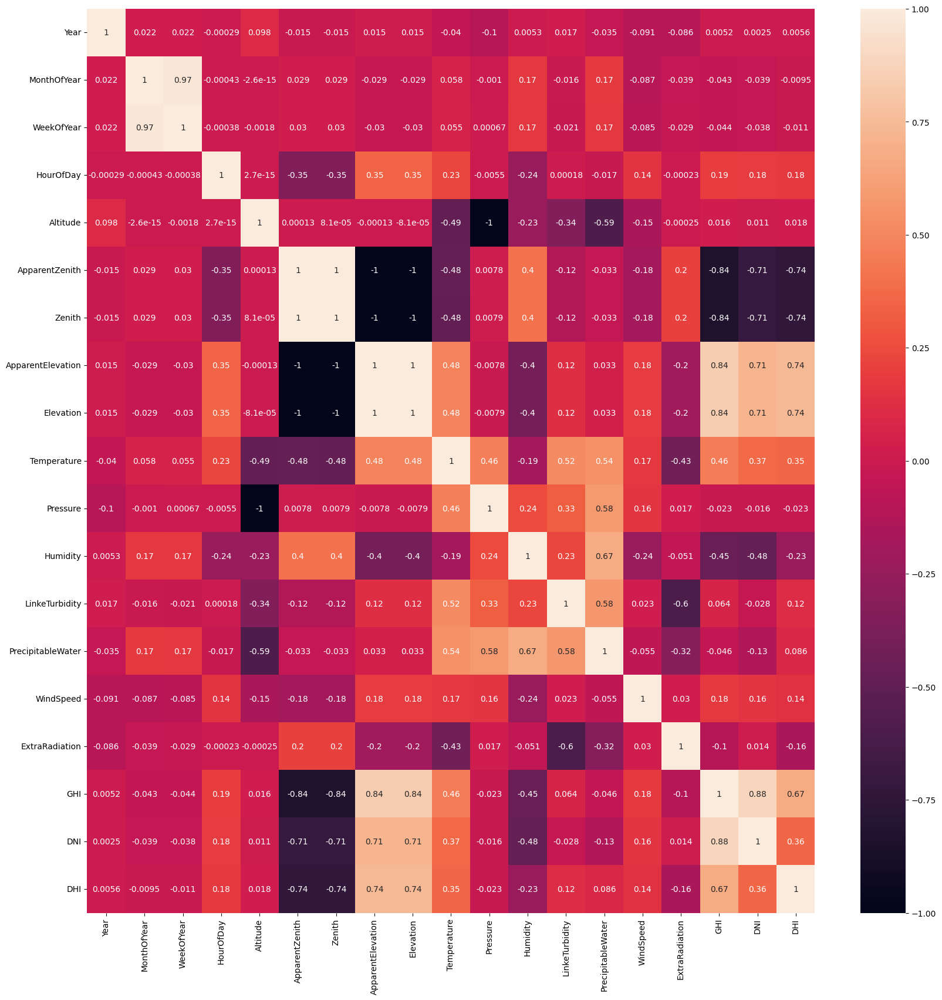

In [ ]:
plt.figure(figsize=(20, 20))
sns.heatmap(df_num.corr(), annot=True)

### Entrenamiento de modelo de Regresión Lineal Múltiple

In [ ]:
X = df[['Elevation', 'Temperature']] # independientes
y = df['ExtraRadiation'] # dependiente

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
# 0.2 significa que el 20% de mis datos se va para test
# Por lo tanto, el 80% se va a para train.


In [ ]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X_train, y_train)

In [ ]:
model.score(X_test, y_test)

In [ ]:
X_test.head()

In [ ]:
y_predict = model.predict(X_test)
y_predict

#Sesión 6 - Visualización avanzada de datos

In [ ]:
#Nuestro DataSet nos proporciona la radiación global en diferentes ciudades, para visualizar la radiación promedio en cada una vamos a crear un arbol
df['Continent'] = 'America'
fig = px.treemap(
    df,
    path=['Continent','TimeZone'],
    values='GHI'
)

fig.show()

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



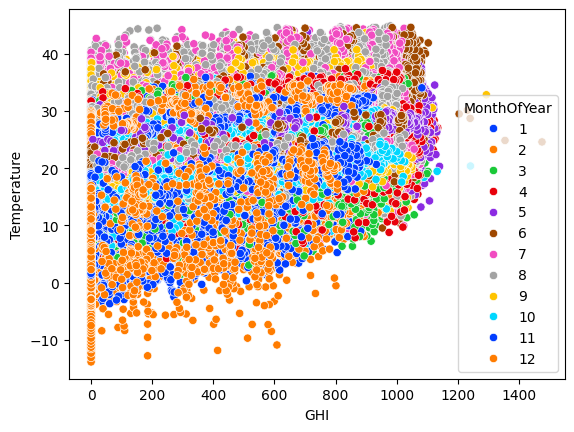

In [ ]:
#ahora vamos a generar un scatter plot por categorias entre la radiación global y la temperatura
sns.scatterplot(data=df, x="GHI", y="Temperature", hue="MonthOfYear", palette='bright');

In [ ]:
#Como podemos ver en la grafica los datos aparecen muy juntos y no es posible saber si existe una variación de la radiación o temperatura atraves del año. Por ello vamos a segmentar la grafica anterior
#Asignamos cada mes a una variable
M1 = df[df['MonthOfYear'] == 1]
M2 = df[df['MonthOfYear'] == 2]
M3 = df[df['MonthOfYear'] == 3]
M4 = df[df['MonthOfYear'] == 4]
M5 = df[df['MonthOfYear'] == 5]
M6 = df[df['MonthOfYear'] == 6]
M7 = df[df['MonthOfYear'] == 7]
M8 = df[df['MonthOfYear'] == 8]
M9= df[df['MonthOfYear'] == 9]
M10 = df[df['MonthOfYear'] == 10]
M11 = df[df['MonthOfYear'] == 11]
M12 = df[df['MonthOfYear'] == 12]

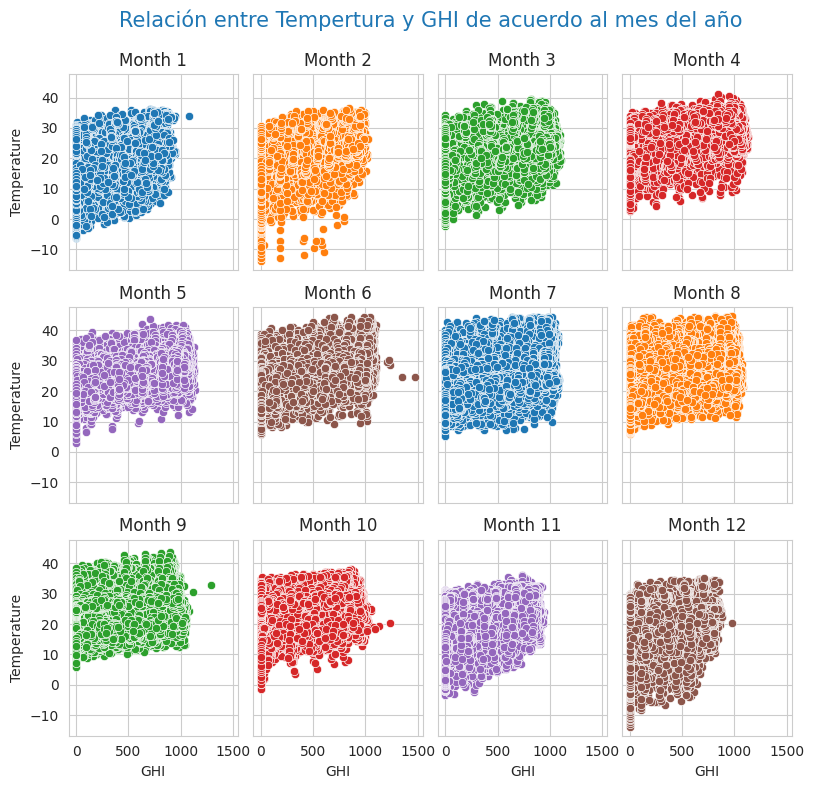

In [ ]:
#Ahora creamos un plot de 3x4 subplots, uno para cada mes del año para visualizar mejor la radiación en función de la temperatura durante los 12 meses del año
sns.set_style('whitegrid')

palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

fig = plt.figure(figsize=(8, 8))
axes = fig.subplots(3, 4, sharex=True, sharey=True)

sns.scatterplot(data=M1, x='GHI', y='Temperature', ax=axes[0, 0], color=palette[0])
sns.scatterplot(data=M2, x='GHI', y='Temperature', ax=axes[0, 1], color=palette[1])
sns.scatterplot(data=M3, x='GHI', y='Temperature', ax=axes[0, 2], color=palette[2])
sns.scatterplot(data=M4, x='GHI', y='Temperature', ax=axes[0, 3], color=palette[3])
sns.scatterplot(data=M5, x='GHI', y='Temperature', ax=axes[1, 0], color=palette[4])
sns.scatterplot(data=M6, x='GHI', y='Temperature', ax=axes[1, 1], color=palette[5])
sns.scatterplot(data=M7, x='GHI', y='Temperature', ax=axes[1, 2], color=palette[0])
sns.scatterplot(data=M8, x='GHI', y='Temperature', ax=axes[1, 3], color=palette[1])
sns.scatterplot(data=M9, x='GHI', y='Temperature', ax=axes[2, 0], color=palette[2])
sns.scatterplot(data=M10, x='GHI', y='Temperature', ax=axes[2, 1], color=palette[3])
sns.scatterplot(data=M11, x='GHI', y='Temperature', ax=axes[2, 2], color=palette[4])
sns.scatterplot(data=M12, x='GHI', y='Temperature', ax=axes[2, 3], color=palette[5])

axes[0, 0].set_title('Month 1')
axes[0, 1].set_title('Month 2')
axes[0, 2].set_title('Month 3')
axes[0, 3].set_title('Month 4')
axes[1, 0].set_title('Month 5')
axes[1, 1].set_title('Month 6')
axes[1, 2].set_title('Month 7')
axes[1, 3].set_title('Month 8')
axes[2, 0].set_title('Month 9')
axes[2, 1].set_title('Month 10')
axes[2, 2].set_title('Month 11')
axes[2, 3].set_title('Month 12')

fig.suptitle('Relación entre Tempertura y GHI de acuerdo al mes del año', fontsize=15, c=palette[0], x=0.53);


plt.tight_layout()
plt.subplots_adjust(top=0.9);
#Como podemos ver la temperatura aumenta cuando nos vamos acercando a la primavera y verano y disminuye hacia el otoño. De igual forma la radiación aumenta siguendo el mismo patrón

In [ ]:
df_grouped = df.groupby('TimeZone')[["Latitude","Longitude",'GHI']].mean()
df_grouped.head()

,Latitude,Longitude,GHI
TimeZone,,,
America/Bahia_Banderas,20.869774,-105.447525,241.346843
America/Belize,17.250990,-88.758545,215.782281
America/Cancun,20.049847,-87.424484,224.723865
America/Chicago,29.420460,-98.492432,211.114967
America/Chihuahua,30.250000,-107.949997,247.907067


In [ ]:
#Muy similar al diagrama de árbol, el mapa nos va a permitir saber la raqdiación promedio en cada una de las ciudades
#Debido a como están ordenados los datos no podemos usar un mapa choropeth pero la libreria folium tiene otras herramientas para visualizar nuestros datos. En este caso usamos un circleMarker que nos permite dibujar un circulo con información como la ubicacion de la ciudad (Latitud,Longitud) y la radiación promedio de cada ciudad.
m = folium.Map(location=[25, -103], zoom_start=5, width="80%", height="80%")

for _, row in df_grouped.iterrows():
    folium.CircleMarker(
        location=(row['Latitude'], row['Longitude']),
        radius=row['GHI'] / 8,  # Ajustar el tamaño del círculo según GHI
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        popup=f"Latitud: {row['Latitude']} Longitud: {row['Longitude']} Radiación: {row['GHI']}"
    ).add_to(m)
folium.LayerControl().add_to(m)
m

In [ ]:
#Ahora vamos a visualizar las radiaciones. De acuerdo a la teoria sabemos que la Radiación Global es la suma de la radiación directa más la radiación difusa, aspi que veamos sí nuestros datos nos confirman esto.
#Vamos a agrupar por ciudad y a obtener la radiación gobal promedio
df_unstack = df.groupby('TimeZone')['GHI'].mean()
df_unstack.head()

,GHI
TimeZone,
America/Bahia_Banderas,241.346843
America/Belize,215.782281
America/Cancun,224.723865
America/Chicago,211.114967
America/Chihuahua,247.907067


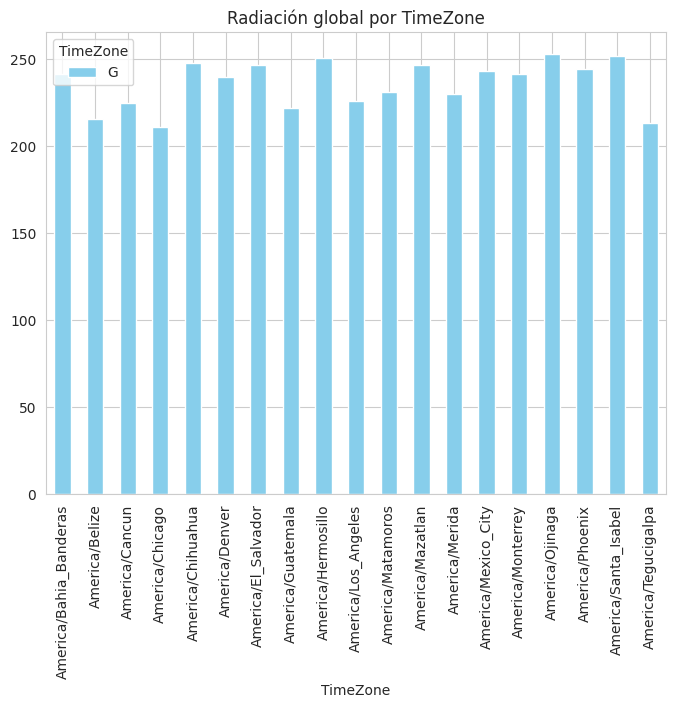

In [ ]:
df_unstack.plot(kind="bar", stacked=True, color=['skyblue'], figsize=(8, 6))

plt.xlabel("TimeZone")
plt.ylabel("")
plt.title("Radiación global por TimeZone");
plt.legend(title="TimeZone", labels='GHI');

In [ ]:
#Ahora hacemos un scatter plot por categrias para sumar la radiación directa más difusa y comparar con la grafica anterior para ver si la suma de ambas es igual al promedio de la global
df_unstack = df.groupby('TimeZone')[['DHI','DNI']].mean()
df_unstack.head()

,DHI,DNI
TimeZone,,
America/Bahia_Banderas,70.748830,255.686282
America/Belize,87.317388,191.349502
America/Cancun,84.193477,212.960051
America/Chicago,70.131636,224.600386
America/Chihuahua,58.213152,298.219246


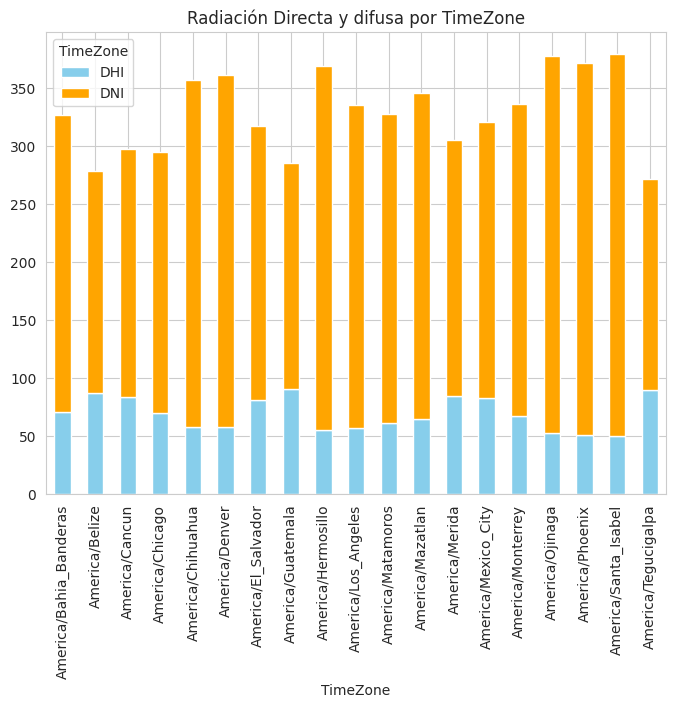

In [ ]:
df_unstack.plot(kind="bar", stacked=True, color=['skyblue', 'orange'], figsize=(8, 6))

plt.xlabel("TimeZone")
plt.ylabel("")
plt.title("Radiación Directa y difusa por TimeZone");
plt.legend(title="TimeZone", labels=['DHI', 'DNI']);
#Como podemos observar hay una discrepancia en los datos, posiblemente por algun factor no contemplado en la suma de radiaciones

#Sesión 7 -  Pruebas A/B y Procesamiento de Lenguaje Natural

#### Prueba A/B

In [ ]:
# La Prueba A/B es un método de experimentación utilizado para comparar dos versiones de una variable (A y B) para determinar cuál de las dos es más efectiva en términos de un objetivo específico.

In [ ]:
# Consiste en:
# División de Grupos: Se divide a los usuarios en dos grupos aleatorios. Un grupo (Grupo A) ve la versión original de la variable, mientras que el otro grupo (Grupo B) ve la versión modificada.
# Medición de Resultados: Se recopilan datos sobre cómo cada grupo interactúa con la variable. Esto puede incluir métricas como tasas de clics, conversiones, tiempo en la página, etc.
# Análisis Comparativo: Se comparan los resultados de ambos grupos para determinar cuál versión tuvo un mejor desempeño en relación con el objetivo definido.

In [ ]:
#Se usa principalmente en:
#Marketing Digital: Para optimizar campañas publicitarias, correos electrónicos, páginas de destino, etc.
#Diseño de Sitios Web y Aplicaciones: Para mejorar la experiencia del usuario, la navegación y la conversión.
#esarrollo de Productos: Para probar nuevas características o cambios en productos antes de un lanzamiento completo.
#Optimización de Contenidos: Para determinar qué versiones de contenido (títulos, imágenes, textos) generan más interacción o conversiones.

In [ ]:
#No se ocupó esta prueba en nuestro dataset debido a:
#La naturaleza del Dataset: Las Pruebas A/B son más adecuadas para contextos donde se evalúan cambios en experiencias de usuario, como en marketing digital, diseño de sitios web o aplicaciones. Nuestro dataset  está enfocado en datos meteorológicos y geográficos, donde las Pruebas A/B no son aplicables puesto que son resultados independientes.
#Objetivo del Análisis: Estas pruebas se utilizan para comparar dos versiones de algo para ver cuál funciona mejor, lo cual no se alinea con el análisis de datos meteorológicos. Nuestro dataset sólo reporta valores relacionados a factores geográficos y meteorológicos, no a pruebas relacionadas entre sí.

#### Procesamiento de Lenguaje Natural

In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

In [ ]:
#El Procesamiento de Lenguaje Natural (NLP) es una rama de la inteligencia artificial que se enfoca en la interacción entre las computadoras y el lenguaje humano. Su objetivo es permitir que las máquinas comprendan, interpreten y respondan al lenguaje de manera que sea natural para los humanos.

In [ ]:
#Consiste en:
#Tokenización: Dividir el texto en unidades más pequeñas, como palabras o frases.
#Lematización y Stemmatización: Reducir las palabras a su forma base o raíz.
#Eliminación de Palabras Vacías (Stopwords): Filtrar palabras comunes que no aportan mucho significado, como “el”, “la”, “de”.
#Análisis Sintáctico: Examinar la estructura gramatical del texto.
#Análisis Semántico: Entender el significado y contexto del texto.
#Reconocimiento de Entidades Nombradas (NER): Identificar y clasificar nombres de personas, lugares, organizaciones, etc.
#Análisis de Sentimientos: Determinar la actitud o emoción expresada en el texto.

In [ ]:
#Se usa principalmente en:
#Asistentes Virtuales: Como Siri, Alexa y Google Assistant, que entienden y responden a comandos de voz.
#Análisis de Sentimientos: Para evaluar opiniones y emociones en redes sociales, reseñas de productos, etc.
#Traducción Automática: Herramientas como Google Translate que traducen texto de un idioma a otro.
#Chatbots: Sistemas automatizados que interactúan con usuarios en tiempo real.
#Corrección y Sugerencia de Texto: Herramientas como Grammarly que ayudan a mejorar la escritura.
#Extracción de Información: Para obtener datos relevantes de grandes volúmenes de texto, como artículos de noticias o documentos legales.

In [ ]:
#No utilizamos este método en nuestro dataset debido a:
#Falta de Datos Textuales: Nuestro dataset no contiene columnas de texto que justifiquen el uso de técnicas de NLP. La mayoría de las columnas son datos numéricos o de tiempo, como la presión, la humedad y la velocidad del viento.
